# Геоаналитика

**Цель:** предсказать успешность (score) объекта ритейла. 

**Целевая метрика:** MAE

**Целевой признак:** score

**Данные:**

- train.csv — обучающая выборка;
- test.csv — тестовая выборка;
- submission_sample.csv — пример решения;
- features.csv содержит дополнительные признаки.

**Признаки:**

- id — уникальный идентификатор объекта ритейла.
- lat — широта.
- lon — долгота.
- score — успешность объекта объекта ритейла.


## Подготовка данных

Импортируем необходимые библиотеки, модели, метрики:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from scipy.spatial.distance import cdist
from itertools import product

from sklearn.model_selection import train_test_split, GridSearchCV


from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from catboost import CatBoostRegressor, Pool
import xgboost as xgb
from xgboost import XGBRegressor

from sklearn.metrics import make_scorer, mean_absolute_error
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.utils import shuffle

STATE = 12345
import time

import re
import warnings
warnings.filterwarnings('ignore')

**Рассмотрим данные:**

Загрузим данные

In [2]:
train_df = pd.read_csv(r'ПУТЬ К ФАЙЛУ')
test_df = pd.read_csv(r'ПУТЬ К ФАЙЛУ')
submission_sample_df = pd.read_csv(r'ПУТЬ К ФАЙЛУ')
features_df = pd.read_csv(r'ПУТЬ К ФАЙЛУ')

In [3]:
train = train_df.copy()
test = test_df.copy()
submission_sample = submission_sample_df.copy()
features = features_df.copy()

Напишем функцию для вывода общей информации о каждом из датасетов.

In [4]:
def analyze_df(df):
    # Вывод информации о данных
    print('Информация о данных:')
    print(df.info())

    # Вывод первых пяти строк
    print('\nПервые пять строк:')
    print(df.head())

    # Вывод статистического описания данных для числовых столбцов
    print('\nОписание данных:')
    print(df.describe())

    # Вывод количества пропущенных значений по каждому столбцу
    print('\nКоличество пропусков:')
    print(df.isna().sum())

    # Вывод количества дублирующихся строк
    print('\nКоличество дубликатов:')
    print(df.duplicated().sum())


# train
# test
# features

In [5]:
analyze_df(train)

Информация о данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3084 entries, 0 to 3083
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      3084 non-null   int64  
 1   lat     3084 non-null   float64
 2   lon     3084 non-null   float64
 3   score   3084 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 96.5 KB
None

Первые пять строк:
   id        lat        lon     score
0   0  56.228300  43.945535  0.080523
1   1  56.834244  53.141543  0.104424
2   2  45.042299  41.990170  0.067615
3   3  59.849408  30.387762  0.088038
4   4  59.839643  30.304308  0.099686

Описание данных:
                id          lat          lon        score
count  3084.000000  3084.000000  3084.000000  3084.000000
mean   1541.500000    55.218066    43.942187     0.134855
std     890.418441     3.832649    12.074348     0.118598
min       0.000000    42.938677    20.472413     0.000000
25%     770.750000    54.706904    37.5

In [6]:
analyze_df(test)

Информация о данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1029 entries, 0 to 1028
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      1029 non-null   int64  
 1   lat     1029 non-null   float64
 2   lon     1029 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 24.2 KB
None

Первые пять строк:
     id        lat        lon
0  3084  55.782276  49.148234
1  3085  56.841500  35.853059
2  3086  55.356780  86.156697
3  3087  56.755087  60.703962
4  3088  59.907438  30.250297

Описание данных:
                id          lat          lon
count  1029.000000  1029.000000  1029.000000
mean   3598.000000    55.242904    43.687656
std     297.191016     3.744061    11.399593
min    3084.000000    43.413594    20.468337
25%    3341.000000    54.922605    37.545807
50%    3598.000000    55.784502    39.739234
75%    3855.000000    56.873786    49.166214
max    4112.000000    61.254378   135.040094

Количест

In [7]:
analyze_df(features)

Информация о данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3701 entries, 0 to 3700
Columns: 365 entries, lat to 362
dtypes: float64(365)
memory usage: 10.3 MB
None

Первые пять строк:
         lat        lon         0         1         2         3         4  \
0  59.837100  30.262701  0.411159  0.360032  0.350883  0.476389  0.373542   
1  59.935705  30.274201  0.500628  0.458489  0.522933  0.538892  0.482807   
2  59.929714  30.419863  0.450037  0.413593  0.445300  0.490658  0.403224   
3  56.111227  40.356119  0.160964  0.146153  0.301632  0.196871  0.157927   
4  56.233351  43.872728  0.102522  0.073835  0.270109  0.129343  0.106780   

          5         6         7  ...       353       354       355       356  \
0  0.399907  0.397579  0.486442  ...  0.041906  0.045916  0.085368  0.093044   
1  0.497257  0.541007  0.482956  ...  0.041262  0.054171  0.066940  0.057510   
2  0.448099  0.516285  0.526028  ...  0.044056  0.052290  0.126482  0.116896   
3  0.130723  0.246422

Серьезных проблем в данных нет, кроме презентации точных координат, однако их округлять не будем. В дальнейшем при обучении моделей избавимся от id. Насчет округления score рассмотрим ниже.

Рассмотрим распределение score из train.

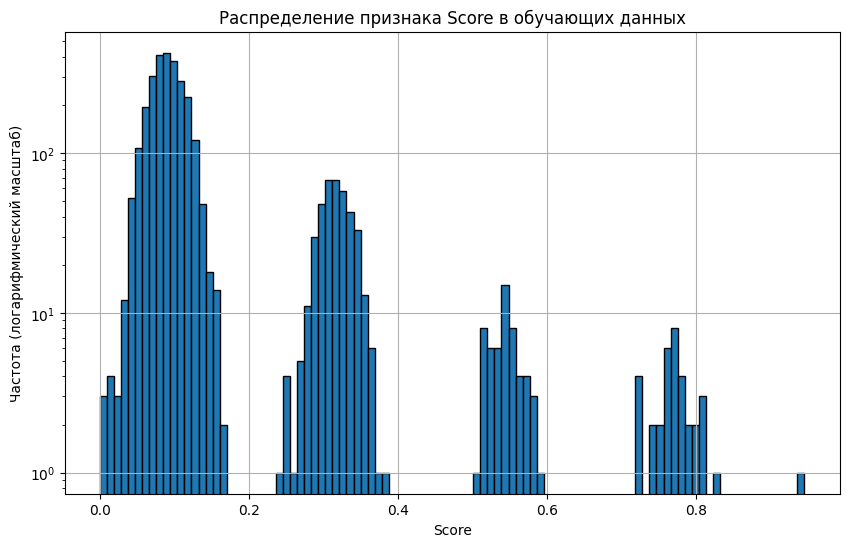

In [8]:
# Визуализация гистограммы признака 'score'
plt.figure(figsize=(10, 6))
plt.hist(train['score'], bins=100, edgecolor='black')
plt.yscale('log')
plt.xlabel('Score') 
plt.ylabel('Частота (логарифмический масштаб)') 
plt.title('Распределение признака Score в обучающих данных')
plt.grid(True) 
plt.show()

По графику видно, что распределение является мультимодальным, с несколькими пиками — это не соответствует одномодальному нормальному распределению. Распределение score с несколькими пиками может указывать на наличие разных групп или кластеров в данных, также указывать на возможную корреляцию с другими данными. Рассмотрим на карте, также корреляцию.

Напишем функцию для визуализации score на карте и затем посмотрим на наших данных. 

In [9]:
def create_map(df, lat_col='lat', lon_col='lon', score_col='score'):
    # Проверка наличия необходимых столбцов
    if lat_col not in df.columns or lon_col not in df.columns:
        print("Данные должны содержать колонки lat и lon.")
        return None
    
    if score_col not in df.columns:
        print("Score не обнаружено.")
        display_scores = False
    else:
        display_scores = True
        # Делим score на категории
        bins = [-float('inf'), 0.25, 0.50, 0.75, float('inf')]
        df['score_category'] = pd.cut(df[score_col], bins, labels=['low', 'medium', 'high', 'very_high'])

    # Определение центра карты
    map_center = [df[lat_col].mean(), df[lon_col].mean()]
    map_object = folium.Map(location=map_center, zoom_start=5)

    # Карта цветов для категорий score
    color_map = {
        'low': 'green',
        'medium': 'yellow',
        'high': 'orange',
        'very_high': 'red'
    }

    # Добавление маркеров на карту
    for idx, row in df.iterrows():
        score_category = row.get('score_category', 'No score data')
        popup_text = f"Score: {row[score_col]}" if display_scores else "No score data"
        marker_color = color_map.get(score_category, 'blue')  # 'blue' используется, если нет данных о score
        
        folium.CircleMarker(
            location=[row[lat_col], row[lon_col]],
            radius=5,  
            popup=popup_text,
            color=marker_color,
            fill=True
        ).add_to(map_object)
    
    return map_object


# map_object.save('map.html')


In [10]:
create_map(train)

In [11]:
create_map(test)

Score не обнаружено.


In [12]:
create_map(features)

Score не обнаружено.


Визуально не прослеживется зависимость между локацией и рейтингом. Посмотрим на корреляционную матрицу.

Напишем функцию для корреляции данных и затем посмотрим на наших данных.

In [13]:
def show_correlation(df):
    # Вычисление корреляционной матрицы
    corr = df.corr()

    # Создание тепловой карты
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', 
                cbar_kws={'label': 'Коэффициент корреляции'})
    plt.title("Тепловая карта корреляции")
    plt.show()

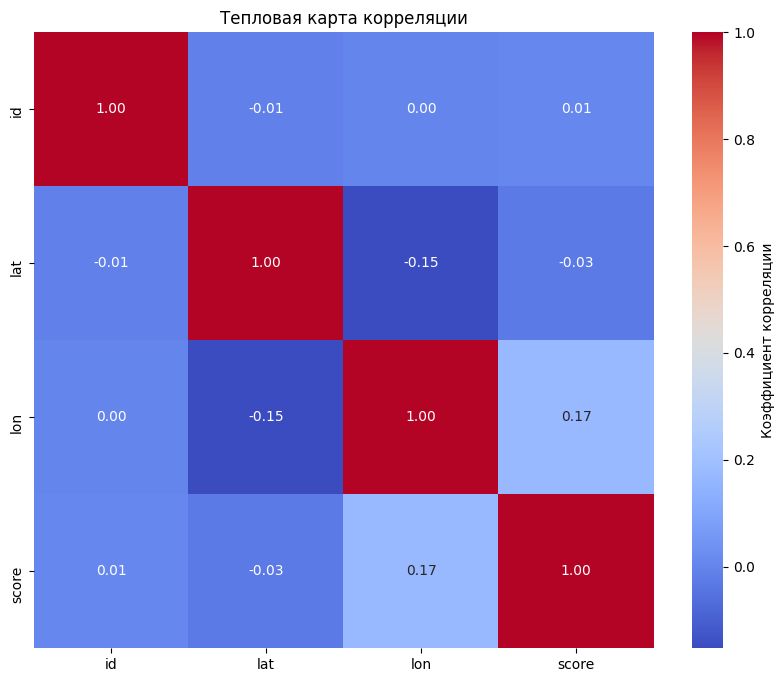

In [14]:
show_correlation(train)

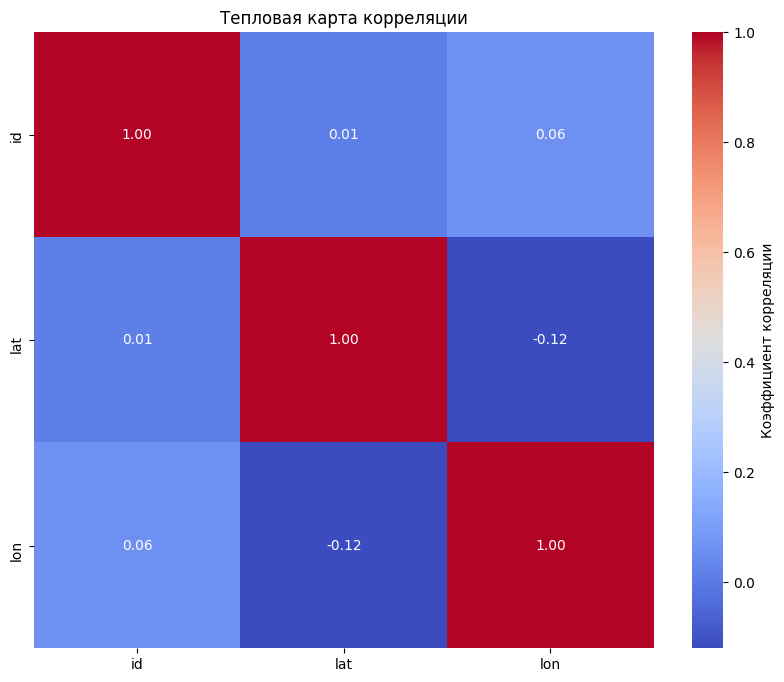

In [15]:
show_correlation(test)

Между  переменными нет существенной корреляции.Неоходимо использовать данные из features. Напишем функцию, которая бы подбирала к train и test данные из features на основе ближайших координат.

In [16]:
def merge_with_closest_coords(main_df, features_df, max_distance=0.01):
    # Извлекаем координаты
    main_coords = main_df[['lat', 'lon']]
    features_coords = features_df[['lat', 'lon']]

    # Вычисляем все попарные расстояния
    distances = cdist(main_coords, features_coords, metric='euclidean')

    # Находим индексы ближайших координат из features для каждой точки из main
    closest_indices = distances.argmin(axis=1)
    
    # Фильтруем только те соединения, которые находятся в пределах заданной максимальной дистанции
    closest_distances = distances.min(axis=1)
    valid_indices = closest_distances <= max_distance
    closest_indices = closest_indices[valid_indices]

    # Сопоставляем main_df и features_df по найденным ближайшим индексам
    main_df = main_df[valid_indices].reset_index(drop=True)
    closest_features = features_df.iloc[closest_indices].reset_index(drop=True)

    # Объединяем данные
    merged_df = pd.concat([main_df, closest_features], axis=1)
    
    return merged_df

# Применение функции
# train_merged = merge_with_closest_coords(train_df, features_df)
# test_merged = merge_with_closest_coords(test_df, features_df)


In [17]:
train_merged = merge_with_closest_coords(train_df, features_df)

In [18]:
test_merged = merge_with_closest_coords(test_df, features_df)

Проверяем данные.

In [19]:
analyze_df(train_merged)

Информация о данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3037 entries, 0 to 3036
Columns: 369 entries, id to 362
dtypes: float64(368), int64(1)
memory usage: 8.6 MB
None

Первые пять строк:
   id        lat        lon     score        lat        lon         0  \
0   0  56.228300  43.945535  0.080523  56.228936  43.945563  0.142355   
1   1  56.834244  53.141543  0.104424  56.834461  53.142202  0.094093   
2   2  45.042299  41.990170  0.067615  45.042112  41.989783  0.151723   
3   3  59.849408  30.387762  0.088038  59.848909  30.387232  0.423663   
4   4  59.839643  30.304308  0.099686  59.839632  30.304086  0.489140   

          1         2         3  ...       353       354       355       356  \
0  0.144008  0.201290  0.145479  ...  0.040666  0.046229  0.043170  0.037397   
1  0.096425  0.161355  0.089489  ...  0.044782  0.050457  0.112922  0.118146   
2  0.148761  0.329598  0.159483  ...  0.067001  0.069333  0.088930  0.103357   
3  0.289528  0.411117  0.516551  ... 

In [20]:
analyze_df(test_merged)

Информация о данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1013 entries, 0 to 1012
Columns: 368 entries, id to 362
dtypes: float64(367), int64(1)
memory usage: 2.8 MB
None

Первые пять строк:
     id        lat        lon        lat        lon         0         1  \
0  3084  55.782276  49.148234  55.781889  49.148733  0.146952  0.193759   
1  3085  56.841500  35.853059  56.841010  35.853298  0.164010  0.161406   
2  3086  55.356780  86.156697  55.356403  86.156863  0.063202  0.084257   
3  3087  56.755087  60.703962  56.754415  60.704371  0.211098  0.222679   
4  3088  59.907438  30.250297  59.906791  30.249927  0.521361  0.438509   

          2         3         4  ...       353       354       355       356  \
0  0.264546  0.121892  0.117690  ...  0.055745  0.063922  0.099472  0.109843   
1  0.294291  0.157831  0.147747  ...  0.013996  0.018743  0.047820  0.000000   
2  0.253100  0.058740  0.058218  ...  0.214480  0.120685  0.425915  0.497822   
3  0.336350  0.202463  0.

Подготовим данные для обучения, удалим индексы, выделим целевой признак.

In [21]:
train.drop(columns=['id', 'score_category'], axis=1, inplace=True)
test.drop(columns=['id'], axis=1, inplace=True)

In [22]:
train_merged.drop(columns=['id'], axis=1, inplace=True)
test_merged.drop(columns=['id'], axis=1, inplace=True)

In [23]:
#Данные без обработки
x_train = train.drop(columns=['score']) #обучающие данные без целевого признака
y_train = train[['score']] #целевой признак 
x_test = test #тестовые данные 

In [24]:
#Данные с дополнительными признаками
x_train_merged = train_merged.drop(columns=['score']) #целевой признак 
y_train_merged = train_merged[['score']] #обучающие данные без целевого признака
x_test_merged = test_merged #тестовые данные 

Разобьем обучающую выборку на две равные части для обучения и валидации.

In [25]:
features_train, features_valid, target_train, target_valid = train_test_split(x_train, y_train, test_size=0.5, 
                                                                              random_state=STATE)

In [26]:
features_train_merged, features_valid_merged, target_train_merged, target_valid_merged = train_test_split(x_train_merged, y_train_merged, test_size=0.5, 
                                                                              random_state=STATE)

### Подытог:

Данные изучены, подготовлены для дальнешего исследования. Необходимо решить задачу регрессии. Есть изначальные и дополненные данные, на каждых из них будем тренировать модели, чтобы определить насколько дополненные данные необходимы.

## Исследование задачи

Подберем лучшие гиперпараметры для моделей на данных для обучения.

### Случайный лес

In [27]:
%%time

# Установка гиперпараметров для поиска
param_grid = {
    'n_estimators': [10, 50, 100],
    'max_depth': [5, 10, 20],
    'min_samples_split': [2, 5, 10]
}

# Создание функции оценки на основе MAE
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)
# Модель для оптимизации
model = RandomForestRegressor(random_state=STATE)

# Поиск по сетке с кросс-валидацией
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring=mae_scorer)

# Подгонка поиска
grid_search.fit(features_train, target_train)

# Лучшие параметры и соответствующий им MAE
best_parameters = grid_search.best_params_
best_mae = -grid_search.best_score_  # Инвертируем знак, так как scorers должны стремиться к увеличению

print('Случайный лес')
print(f'Лучшие параметры: {best_parameters}')
print(f'Лучший MAE: {best_mae}')

Случайный лес
Лучшие параметры: {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 50}
Лучший MAE: 0.05500695851807628
CPU times: total: 12.8 s
Wall time: 18.9 s


In [28]:
model.fit(x_train, y_train)
test_predict = model.predict(x_test)
print(test_predict)
test_predict = pd.DataFrame(test_predict, columns=['id,score'])

[0.07041113 0.08394143 0.09038276 ... 0.19370309 0.14229723 0.10069468]


In [29]:
%%time

model = RandomForestRegressor(random_state=STATE, n_estimators=50, max_depth=20)
model.fit(features_train_merged, target_train_merged)
predicted_valid = model.predict(features_valid_merged)
print('Случайный лес на дополненных данных')
print('Метрика MAE', mean_absolute_error(target_valid_merged, predicted_valid))

Случайный лес на дополненных данных
Метрика MAE 0.06954265632452367
CPU times: total: 13.3 s
Wall time: 21.2 s


MAE лучше на изначальных данных.

### XGBoost

In [30]:
%%time

# Создание модели XGBoost
model = XGBRegressor()

# Задание сетки параметров для поиска
param_grid = {
    'max_depth': [3, 6, 9],
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2]
}

# Поиск по сетке с кросс-валидацией
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_absolute_error', verbose=1)

# Подгонка поиска
grid_search.fit(features_train, target_train)

# Лучшие параметры и соответствующий им MAE
print('Лучшие параметры для XGBoost', grid_search.best_params_)
print('Лучший MAE:', -grid_search.best_score_)


Fitting 5 folds for each of 27 candidates, totalling 135 fits
Лучшие параметры для XGBoost {'learning_rate': 0.1, 'max_depth': 9, 'n_estimators': 50}
Лучший MAE: 0.056001986080714786
CPU times: total: 39.8 s
Wall time: 12.4 s


### CatBoost

In [31]:
# Подготовка данных в формате Pool, который предпочтителен для CatBoost
train_pool = Pool(features_train, target_train)
valid_pool = Pool(features_valid, target_valid)

In [32]:
%%time



# Инициализация модели
model = CatBoostRegressor(loss_function='MAE', eval_metric='MAE', verbose=False)

# Задание сетки гиперпараметров для поиска
grid = {
    'learning_rate': [0.03, 0.1],
    'depth': [4, 6, 10],
    'l2_leaf_reg': [1, 3, 5, 7, 9]
}

# Поиск лучших параметров
grid_search_result = model.grid_search(grid, train_pool, cv=3, partition_random_seed=0, stratified=False, verbose=False)

# Лучшие параметры
best_params = grid_search_result['params']
print(f'Лучшие параметры: {best_params}')



bestTest = 0.05505626561
bestIteration = 997


bestTest = 0.05346010212
bestIteration = 786


bestTest = 0.0549758608
bestIteration = 994


bestTest = 0.05480372336
bestIteration = 822


bestTest = 0.05518183511
bestIteration = 984


bestTest = 0.05429526654
bestIteration = 632


bestTest = 0.05522946208
bestIteration = 998


bestTest = 0.05504251812
bestIteration = 985


bestTest = 0.05525209914
bestIteration = 988


bestTest = 0.05439781688
bestIteration = 994


bestTest = 0.05404527562
bestIteration = 999


bestTest = 0.05116448377
bestIteration = 998


bestTest = 0.05415132114
bestIteration = 998


bestTest = 0.05250548518
bestIteration = 779


bestTest = 0.05373190263
bestIteration = 954


bestTest = 0.05351618648
bestIteration = 908


bestTest = 0.05429283623
bestIteration = 982


bestTest = 0.05275815905
bestIteration = 905


bestTest = 0.05409265947
bestIteration = 978


bestTest = 0.05331009252
bestIteration = 792


bestTest = 0.05253416252
bestIteration = 998


bestTest = 0.

In [33]:
%%time

# Обучение модели с лучшими параметрами 
model = CatBoostRegressor(loss_function='MAE', eval_metric='MAE', depth = 10,
                          l2_leaf_reg = 7, learning_rate = 0.1, verbose=False)
model.fit(train_pool, eval_set=valid_pool)

# Прогнозирование на валидационной выборке
predictions = model.predict(valid_pool)

print('Catboost')
print('Лучший MAE:', mean_absolute_error(target_valid, predictions))

Catboost
Лучший MAE: 0.049044662544265524
CPU times: total: 16.6 s
Wall time: 15.5 s


In [34]:
model.fit(x_train, y_train)
test_predict = model.predict(x_test)
print(test_predict)
test_predict = pd.DataFrame(test_predict, columns=['score'])


[0.08035894 0.07452626 0.08339554 ... 0.14044328 0.34089666 0.0968614 ]


In [35]:
test_predict['id'] = test_df['id']
test_predict = test_predict[['id', 'score']]

In [36]:
test_predict.head()

,id,score
0,3084,0.080359
1,3085,0.074526
2,3086,0.083396
3,3087,0.116259
4,3088,0.089382


### Сохраняем предсказания в CSV файл

In [37]:
submission = test_predict.to_csv(r'ПУТЬ К ФАЙЛУ', index=False)

### Вывод

Лучшие показатели по предсказанию у модели Catboost на изначальных данных c гиперпараметрами: depth: 10, l2_leaf_reg: 7, learning_rate: 0.1.